# Exercise 1


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.sparse
import scipy.sparse.linalg as spla
from scipy.sparse import csr_matrix
from time import process_time
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation

In [3]:
from matplotlib import rc
rc('animation', html='jshtml')

**Solve the advection equation $u_t − u_x = 0$ for $x \in (0, 1)$ and $T = 2$ with FTCS, BTCS and Leapfrog schemes. The initial data is given by
\begin{equation}
    u(0, x) = e^{\frac{-(x-0.2)^2}{0.01}}
\end{equation}
use the periodic boundary condition.**

In [4]:
# temporal domain
tmin = 0
tmax = 1

# spatial domain
xmin = 0
xmax = 1

a = -1 # parameter of the eq u_t+a*u_x=0

# initial condition u(0,x)
def initial_u(x):
    return np.exp(-np.power((x-0.2), 2)/0.01)


# num of grid points
N = 500
J = 50


# each value of the U array contains the solution for all x values at each timestep
U = []


deltat = (tmax - tmin)/N
h = (xmax - xmin)/(J-1)

Lambda = deltat/h


# x grid of J points (to plot the graph)
X, dx = np.linspace(xmin, xmax, J, retstep=True)

FTCS

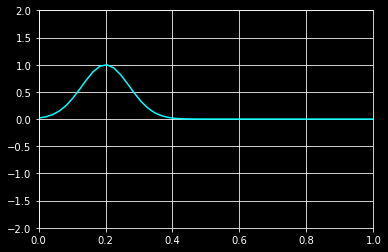

In [5]:
# FTCS scheme
def u(x, t):
    if t == 0:  # initial condition
        return initial_u(x)
    uvals = []  # u values for this time step
    for j in range(len(x)):
        if j == 0:  # left boundary (using periodicy of boundary conditions)
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][J-1] - U[t-1][j+1]))
        elif j == J-1:  # right boundary
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][j-1] - U[t-1][0]))
        else:
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][j-1] - U[t-1][j+1]))
    return uvals


# solve for 500 time steps
for t in range(N):
    U.append(u(X, t))

# plot solution
plt.style.use('dark_background')
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)

# animate the time data
k = 0

def animate(i):
    global k
    x = U[k]
    k += 1
    ax1.clear()
    ax1.grid(True)
    ax1.set_ylim([-2, 2])
    ax1.set_xlim([0, 1])
    ax1.plot(X, x, color='cyan')
    

anim = animation.FuncAnimation(fig, animate, frames=360, interval=20)

In [6]:
# IF THE ANIMATION DOESN'T WORK, RECOMPLILE THIS BLOCK
anim

BTCS

Using the relation of the Implicit Euler method:
$$U_j^{n+1}+\frac{a\lambda}{2}\Bigl( U_{j+1}^{n+1} - U_{j-1}^{n+1} \Bigr) = U_j^{n}, \quad \lambda = dt/h$$
we define the matrix $A$ and at each step we solve the system $U^{n+1}=AU^n+b$.

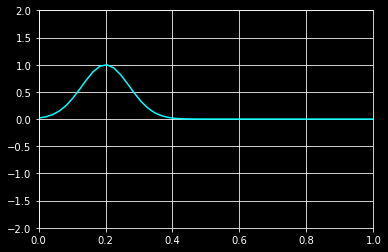

In [7]:
# BTCS scheme
U = np.zeros((N,J))

A = np.zeros((J,J))
for j in range(0,J):
  if j == 0:
    A[j,j] = 1
    A[j,j+1] = a*Lambda/2
  elif j == J-1:
    A[j,j] = 1
    A[j,j-1] = -a*Lambda/2
  else:
    A[j,j-1] = -a*Lambda/2
    A[j,j] = 1
    A[j,j+1] = a*Lambda/2



# to determine b we use the boundary conditions of periodicity
b = np.zeros(J)
b[0] = a*Lambda*initial_u(1)/2
b[J-1] = -a*Lambda*initial_u(0)/2

# initial condition
for j in range(J):
  U[0,j] = initial_u(j*h)

A_csr = csr_matrix(A) 

# solve for 500 time steps
for t in range(1,N):
  #U[t] = np.linalg.solve(A,U[t-1]) + b    #we can use a more efficient algorithm using the fact that A is sparse as below (comment this line to do so)
  U[t] = spla.dsolve.spsolve(A_csr,U[t-1]) + b
  b[0] = a*Lambda*U[t,J-1]/2
  b[J-1] = -a*Lambda*U[t,0]/2


#print(U[3])

# plot solution
plt.style.use('dark_background')
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)

# animate the time data
k = 0


def animate(i):
    global k
    x = U[k]
    k += 1
    ax1.clear()
    ax1.plot(X, x, color='cyan')
    ax1.grid(True)
    ax1.set_ylim([-2, 2])
    ax1.set_xlim([0, 1])

anim = animation.FuncAnimation(fig, animate, frames=360, interval=20)

In [8]:
# IF THE ANIMATION DOESN'T WORK, RECOMPLILE THIS BLOCK
anim

Leap-Frog

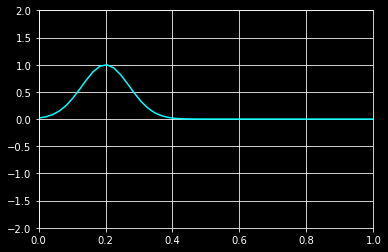

In [9]:
U = []

# Leap-frog scheme
def u(x, t):
# initial condition
    if t == 0:  
        return initial_u(x)
    uvals = []  # u values for this time step

#Leap-frog is not self-starting, let's use FTCS for the first step
    if t == 1:  
      for j in range(len(x)):
        if j == 0:  # left boundary (using periodicy of boundary conditions)
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][J-1] - U[t-1][j+1]))
        elif j == J-1:  # right boundary
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][j-1] - U[t-1][0]))
        else:
            uvals.append(U[t-1][j] + a*Lambda/2*(U[t-1][j-1] - U[t-1][j+1]))
      return uvals
    for j in range(len(x)):
        if j == 0:  # left boundary (using periodicy of boundary conditions)
            uvals.append(U[t-2][j] + a*Lambda*(U[t-1][J-1] - U[t-1][j+1]))
        elif j == J-1:  # right boundary
            uvals.append(U[t-2][j] + a*Lambda*(U[t-1][j-1] - U[t-1][0]))
        else:
            uvals.append(U[t-2][j] + a*Lambda*(U[t-1][j-1] - U[t-1][j+1]))
    return uvals


# solve for 500 time steps
for t in range(N):
    U.append(u(X, t))

# plot solution
plt.style.use('dark_background')
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)

# animate the time data
k = 0

def animate(i):
    global k
    x = U[k]
    k += 1
    ax1.clear()
    ax1.plot(X, x, color='cyan')
    ax1.grid(True)
    ax1.set_ylim([-2, 2])
    ax1.set_xlim([0, 1])

anim = animation.FuncAnimation(fig, animate, frames=360, interval=20)

In [10]:
# IF THE ANIMATION DOESN'T WORK, RECOMPLILE THIS BLOCK
anim

- **Hand in plots of the numerical solution together with the exact solution.**

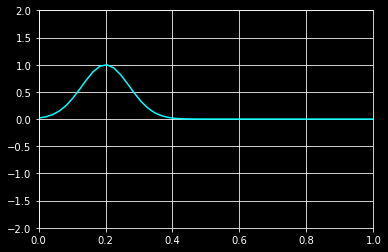

In [11]:
U = []

# Exact solution
def u(x, t):
    return np.exp(-np.power((x-a*t-0.2), 2)/0.01)


# solve for 500 time steps
for t in np.linspace(0, 1, 500): #range(N):
    U.append(u(X, t))

# plot solution
plt.style.use('dark_background')
fig = plt.figure()
ax1 = fig.add_subplot(1, 1, 1)

# animate the time data
k = 0

def animate(i):
    global k
    x = U[k]
    k += 1
    ax1.clear()
    ax1.plot(X, x, color='cyan')
    ax1.grid(True)
    ax1.set_ylim([-2, 2])
    ax1.set_xlim([0, 1])

anim = animation.FuncAnimation(fig, animate, frames=360, interval=20)

In [12]:
# IF THE ANIMATION DOESN'T WORK, RECOMPLILE THIS BLOCK
anim